# Azure Computer Vision 4 (Florence)

## Fashion Visual Search - Search using an image or a prompt

![Image](florence.jpg)

![Image](fashionheader.png)

<br>
<i>Note: this image was generated with Azure Open AI Dall-e 2</i>

### Visual search with vector embeddings
**Vector embeddings** are a way of representing content such as text or images as vectors of real numbers in a high-dimensional space. These embeddings are often learned from large amounts of textual and visual data using machine learning algorithms like neural networks. Each dimension of the vector corresponds to a different feature or attribute of the content, such as its semantic meaning, syntactic role, or context in which it commonly appears. By representing content as vectors, we can perform mathematical operations on them to compare their similarity or use them as inputs to machine learning models.

![Image](embeddings.jpg)


### Business applications
- **Digital asset management**: Image retrieval can be used to manage large collections of digital images, such as in museums, archives, or online galleries. Users can search for images based on visual features and retrieve the images that match their criteria.
- **Medical image retrieval**: Image retrieval can be used in medical imaging to search for images based on their diagnostic features or disease patterns. This can help doctors or researchers to identify similar cases or track disease progression.
- **Security and surveillance**: Image retrieval can be used in security and surveillance systems to search for images based on specific features or patterns, such as in, people & object tracking, or threat detection.
- **Forensic image retrieval**: Image retrieval can be used in forensic investigations to search for images based on their visual content or metadata, such as in cases of cyber-crime.
- **E-commerce**: Image retrieval can be used in online shopping applications to search for similar products based on their features or descriptions or provide recommendations based on previous purchases.
- **Fashion and design**: Image retrieval can be used in fashion and design to search for images based on their visual features, such as color, pattern, or texture. This can help designers or retailers to identify similar products or trends.

### Visual Search Process
![Image](fashionprocess.png)

### Image Retrieval with Azure Computer Vision Documentation
- https://learn.microsoft.com/en-us/azure/cognitive-services/computer-vision/concept-image-retrieval
- https://learn.microsoft.com/en-us/azure/cognitive-services/computer-vision/how-to/image-retrieval

### Demo images
Demo images are a sample of this collection of images: https://www.kaggle.com/competitions/h-and-m-personalized-fashion-recommendations/data
<br><br>
> Serge Retkowsky | Microsoft | https://github.com/retkowsky | 3rd of May, 2023

## 1. <a name="chapt1"></a> Librairies

In [1]:
import datetime
import glob
import json
import os
import random
import sys
import time

from dotenv import load_dotenv
from PIL import Image

In [2]:
# Getting Azure CV endpoint and key from the azure.env file

load_dotenv("azure.env")
key = os.getenv("azure_cv_key")
endpoint = os.getenv("azure_cv_endpoint")

### Importing our specific functions

In [3]:
pyfile = "azure.py"

print("Python file:", pyfile, "Date:", time.ctime(os.path.getmtime(pyfile)))

Python file: azure.py Date: Fri Jan 17 16:58:00 2025


In [4]:
from azure import (
    describe_image_with_AzureCV4,
    get_image_from_url,
    get_results_using_image,
    get_results_using_prompt,
    remove_background,
    side_by_side_images,
    view_image,
)

## 2. <a name="chapt2"></a> Informations

In [5]:
sys.version

'3.11.9 (tags/v3.11.9:de54cf5, Apr  2 2024, 10:12:12) [MSC v.1938 64 bit (AMD64)]'

In [6]:
print("Today is", datetime.datetime.today())

Today is 2025-01-17 19:44:14.641238


## 3. <a name="chapt3"></a> Our products images

In [7]:
IMAGES_DIR = "fashion"

In [8]:
image_files = glob.glob(IMAGES_DIR + "/*")

print("Directory of images:", IMAGES_DIR)
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Directory of images: fashion
Total number of catalog images = 1,473


### Some images

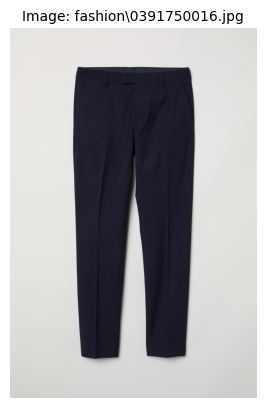

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a pair of pants on a wall = 0.732

   Detected tags:
    clothing           = 1.000
    trouser            = 0.986
    trousers           = 0.895
    pocket             = 0.868
    person             = 0.846
    pants              = 0.437


In [9]:
idx = 1

view_image(image_files[idx])
describe_image_with_AzureCV4(image_files[idx])

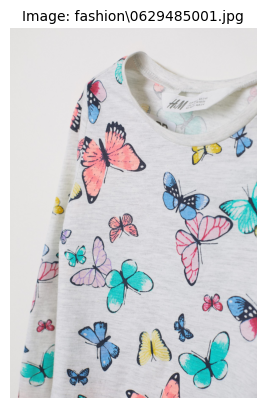

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a shirt with butterflies on it = 0.886

   Detected tags:
    butterfly          = 0.962
    moths and butterflies = 0.912
    pattern (fashion design) = 0.908
    invertebrate       = 0.883
    insect             = 0.881


In [10]:
idx = 500

view_image(image_files[idx])
describe_image_with_AzureCV4(image_files[idx])

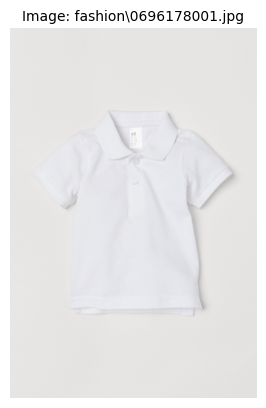

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a white shirt on a white background = 0.861

   Detected tags:
    clothing           = 0.998
    active shirt       = 0.897
    top                = 0.881
    casual dress       = 0.843
    white              = 0.841
    shirt              = 0.838
    fabric             = 0.721
    sleeve             = 0.586


In [11]:
idx = int(random.uniform(0, len(image_files)))

view_image(image_files[idx])
describe_image_with_AzureCV4(image_files[idx])

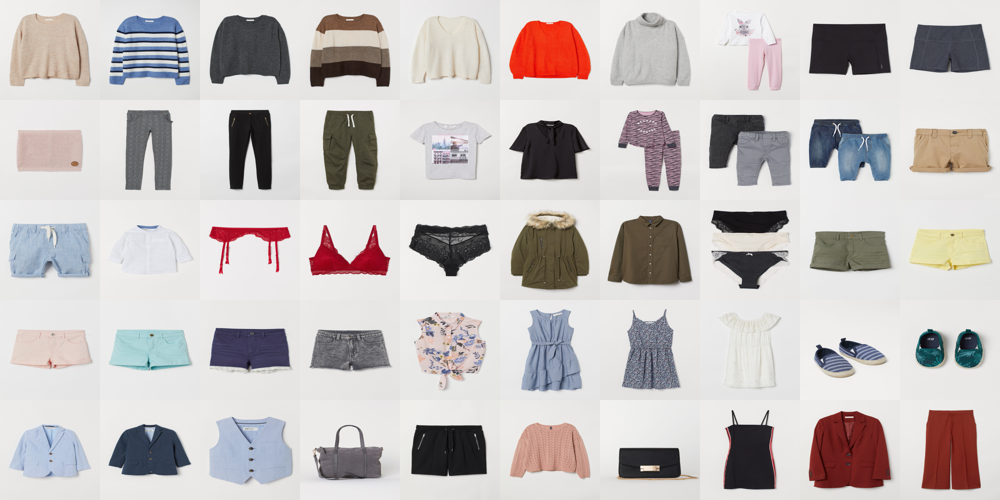

In [12]:
num_images_per_row = 10
num_images_per_col = 5

img_size = 200
start = 1000
samples = image_files[start : start + (num_images_per_row * num_images_per_col)]

samples_images = Image.new(
    "RGB", (num_images_per_row * img_size, num_images_per_col * img_size)
)

for idx, image_file in enumerate(samples):
    img = Image.open(image_file)
    img = img.resize((img_size, img_size))
    x = (idx % num_images_per_row) * img_size
    y = (idx // num_images_per_row) * img_size
    samples_images.paste(img, (x, y))

samples_images

## 4. <a name="chapt4"></a> Loading vector embeddings

In [13]:
JSON_DIR = "json"

glob.glob(JSON_DIR + "/*.json")

['json\\img_embed_17Jan2025_192438.json']

In [14]:
print("Importing vectors embeddings...")

jsonfiles = [entry.name for entry in os.scandir(JSON_DIR) if entry.is_file()]
jsonfiles = [f for f in jsonfiles if os.path.isfile(os.path.join(JSON_DIR, f))]

# Get the most recent file
modification_times = [
    (f, os.path.getmtime(os.path.join(JSON_DIR, f))) for f in jsonfiles
]
modification_times.sort(key=lambda x: x[1], reverse=True)
most_recent_file = JSON_DIR + "/" + modification_times[0][0]

# Loading the most recent file
print(f"Loading the most recent file of the vector embeddings: {most_recent_file}")

with open(most_recent_file) as f:
    list_emb = json.load(f)

print(f"\nDone: number of imported vector embeddings = {len(list_emb):,}")

Importing vectors embeddings...
Loading the most recent file of the vector embeddings: json/img_embed_17Jan2025_192438.json

Done: number of imported vector embeddings = 1,473


## 5. <a name="chapt5"></a> Visual search using a field image

We can use a reference image and find the most similar images.
In this demo we will use the reference image without its background
(Azure Computer Vision 4 can automatically remove the background). The search will be made using the image without its background.


In [15]:
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Total number of catalog images = 1,473


In [16]:
TEST_DIR = "test"

test_images = glob.glob(f"{TEST_DIR}/*")
print(f"Total number of test images = {len(test_images)}")

Total number of test images = 6


### Test 1

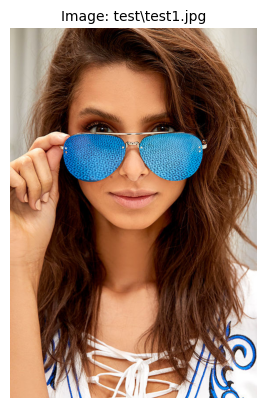

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a woman wearing blue sunglasses = 0.785

   Detected tags:
    human face         = 0.990
    person             = 0.988
    fashion accessory  = 0.947
    goggles            = 0.931
    long hair          = 0.930
    clothing           = 0.924
    lipstick           = 0.915
    lip                = 0.911
    eyewear            = 0.894
    cool               = 0.868
    photo shoot        = 0.868
    cosmetics          = 0.866
    woman              = 0.864
    fashion            = 0.857
    lip gloss          = 0.856
    throat             = 0.847
    eyelash            = 0.843
    lady               = 0.842
    model              = 0.841
    girl               = 0.671
    hair               = 0.664
    wearing            = 0.645
    sunglasses         = 0.571


In [17]:
reference_image = test_images[0]

view_image(reference_image)
describe_image_with_AzureCV4(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


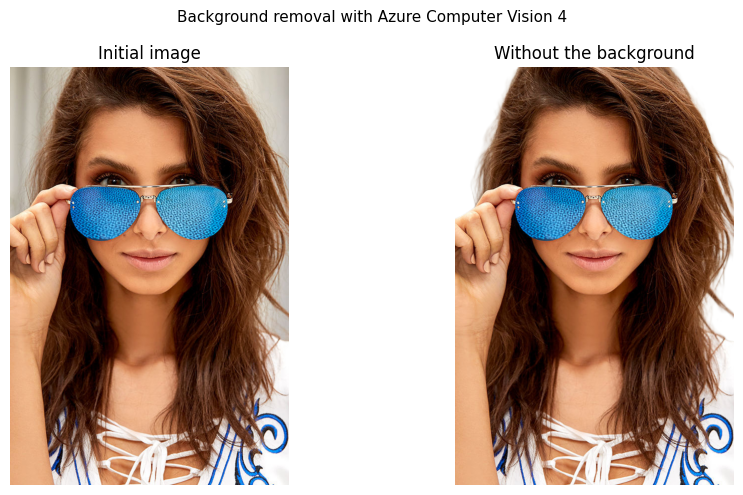

In [18]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion\0620319010.jpg with similarity index = 0.6391991795484249
002 fashion\0646754002.jpg with similarity index = 0.6068193989964521
003 fashion\0620139003.jpg with similarity index = 0.5844950715025292
004 fashion\0623350001.jpg with similarity index = 0.5535542710512158
005 fashion\0398959003.jpg with similarity index = 0.5438523996043402
006 fashion\0629390001.jpg with similarity index = 0.5392791551640855


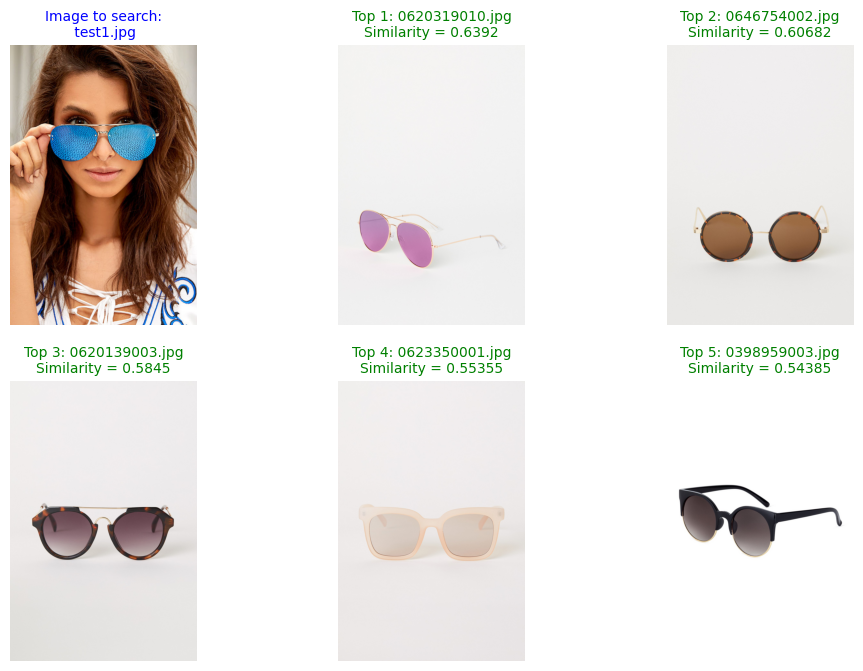

 2025-01-17 19:44:35 Powered by Azure Computer Vision Florence


,image_file,similarity
75,fashion\0620319010.jpg,0.639199
732,fashion\0646754002.jpg,0.606819
49,fashion\0620139003.jpg,0.584495
205,fashion\0623350001.jpg,0.553554
26,fashion\0398959003.jpg,0.543852
...,...,...
383,fashion\0626443007.jpg,0.237906
1259,fashion\0696991021.jpg,0.232445
602,fashion\0641748010.jpg,0.229109
1071,fashion\0694297002.jpg,0.222803


In [19]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 2

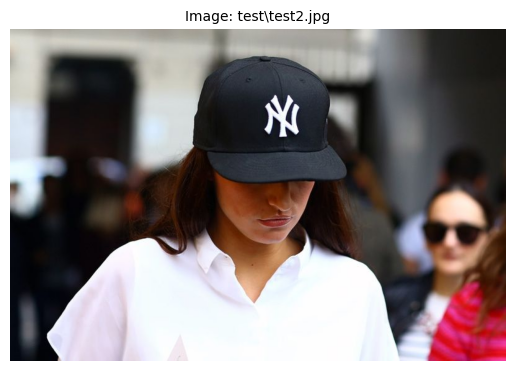

In [20]:
reference_image = test_images[1]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


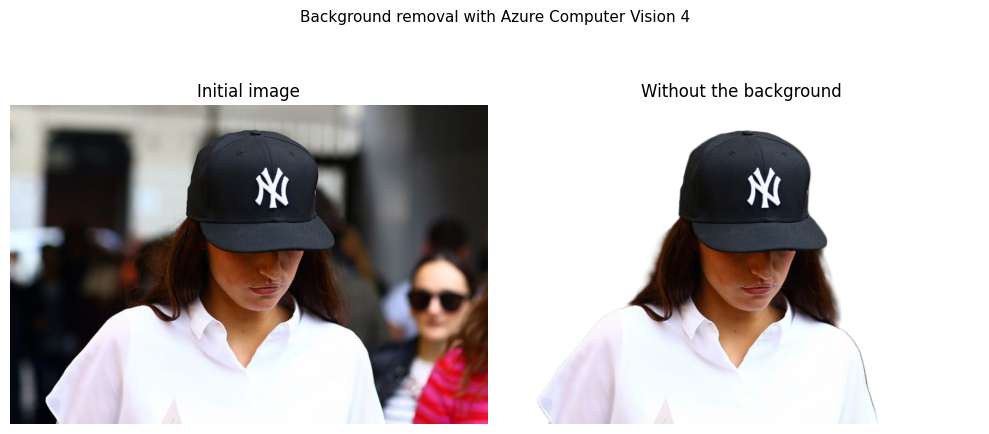

In [21]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion\0694739001.jpg with similarity index = 0.6136318528023333
002 fashion\0694739003.jpg with similarity index = 0.5850528812087161
003 fashion\0694739020.jpg with similarity index = 0.5683735229538608
004 fashion\0694739030.jpg with similarity index = 0.5631720783267713
005 fashion\0628750003.jpg with similarity index = 0.546757225280305
006 fashion\0391032009.jpg with similarity index = 0.5411799468158865


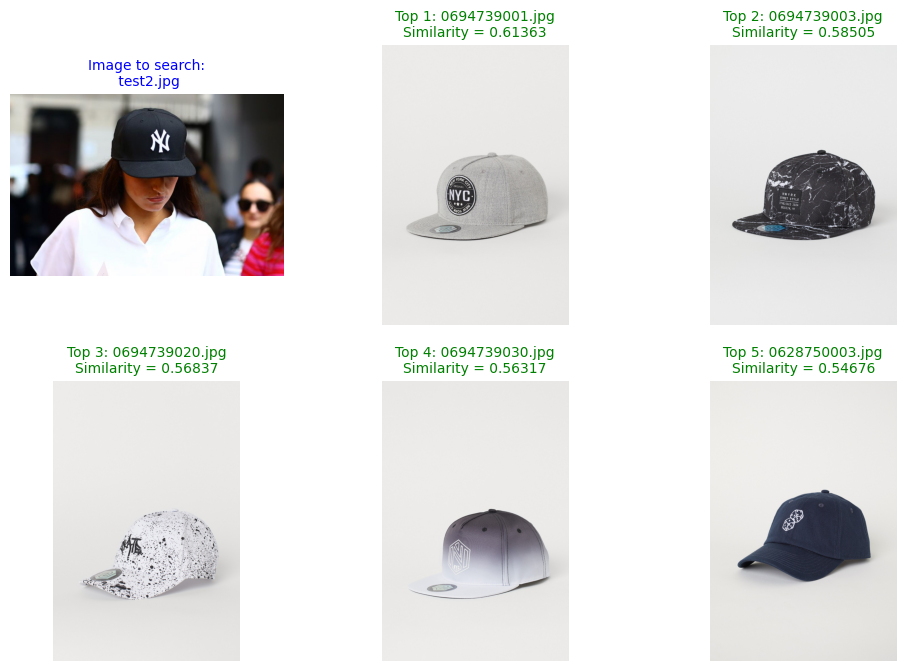

 2025-01-17 19:44:41 Powered by Azure Computer Vision Florence


,image_file,similarity
1099,fashion\0694739001.jpg,0.613632
1100,fashion\0694739003.jpg,0.585053
1101,fashion\0694739020.jpg,0.568374
1102,fashion\0694739030.jpg,0.563172
467,fashion\0628750003.jpg,0.546757
...,...,...
1324,fashion\0697814001.jpg,0.234418
1062,fashion\0694131017.jpg,0.232359
1279,fashion\0697082010.jpg,0.226104
1278,fashion\0697082008.jpg,0.225486


In [22]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 3

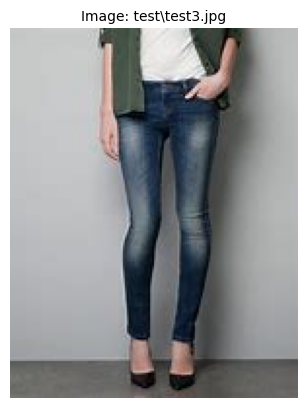

In [23]:
reference_image = test_images[2]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


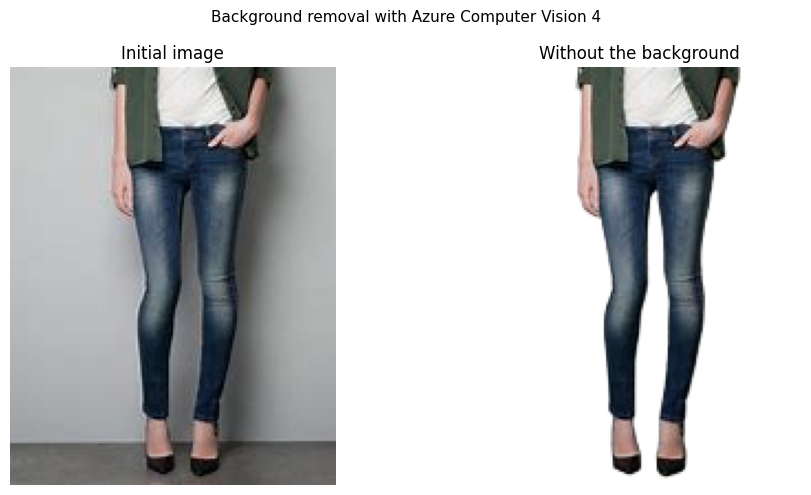

In [24]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion\0624251001.jpg with similarity index = 0.7175554612613277
002 fashion\0625047001.jpg with similarity index = 0.7004086516185264
003 fashion\0640331007.jpg with similarity index = 0.6993559665763702
004 fashion\0399136060.jpg with similarity index = 0.6992753313089167
005 fashion\0698387005.jpg with similarity index = 0.6986563819248095
006 fashion\0624257005.jpg with similarity index = 0.6944322224124558


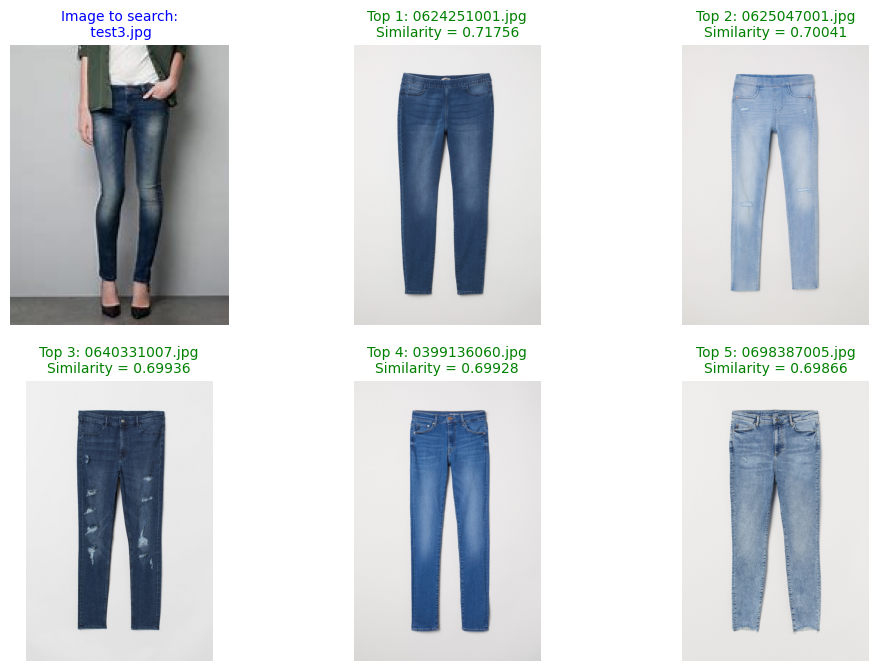

 2025-01-17 19:44:46 Powered by Azure Computer Vision Florence


,image_file,similarity
247,fashion\0624251001.jpg,0.717555
290,fashion\0625047001.jpg,0.700409
550,fashion\0640331007.jpg,0.699356
35,fashion\0399136060.jpg,0.699275
1360,fashion\0698387005.jpg,0.698656
...,...,...
1125,fashion\0695063001.jpg,0.326249
506,fashion\0629656005.jpg,0.326049
629,fashion\0642779001.jpg,0.304411
1286,fashion\0697097003.jpg,0.296244


In [25]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 4

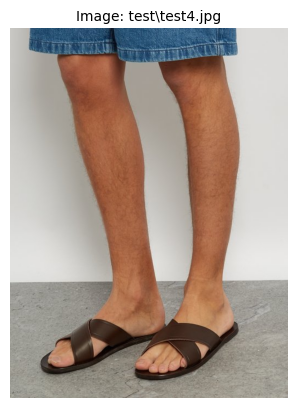

In [26]:
reference_image = test_images[3]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


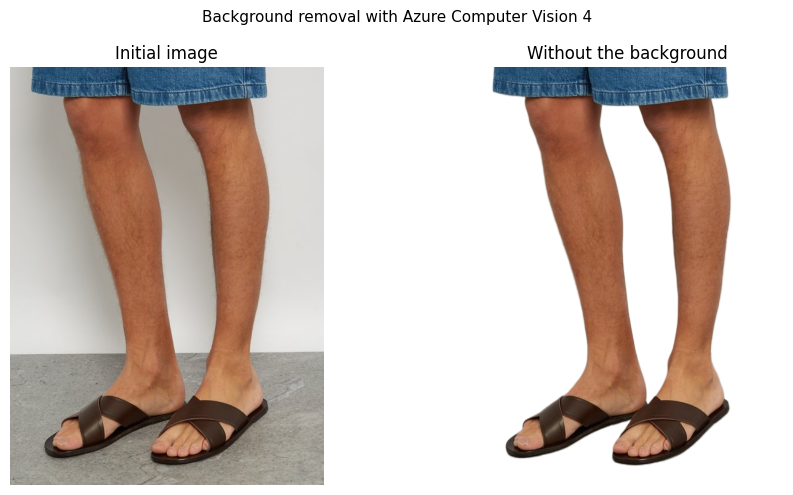

In [27]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion\0640989002.jpg with similarity index = 0.65370349517064
002 fashion\0623934002.jpg with similarity index = 0.6202708063247707
003 fashion\0621915004.jpg with similarity index = 0.6085346195718161
004 fashion\0620608001.jpg with similarity index = 0.5880802074801504
005 fashion\0620179001.jpg with similarity index = 0.5795579887430824
006 fashion\0629416001.jpg with similarity index = 0.567907166250341


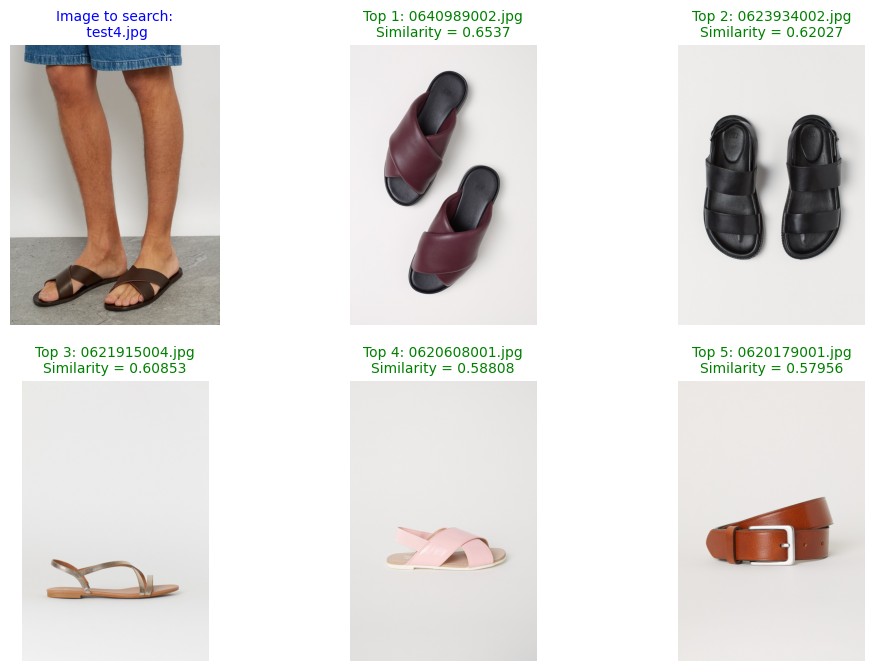

 2025-01-17 19:44:52 Powered by Azure Computer Vision Florence


,image_file,similarity
580,fashion\0640989002.jpg,0.653703
229,fashion\0623934002.jpg,0.620271
145,fashion\0621915004.jpg,0.608535
92,fashion\0620608001.jpg,0.588080
51,fashion\0620179001.jpg,0.579558
...,...,...
742,fashion\0646811010.jpg,0.239602
640,fashion\0642975002.jpg,0.236043
681,fashion\0644678006.jpg,0.233400
401,fashion\0626648003.jpg,0.231620


In [28]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 5

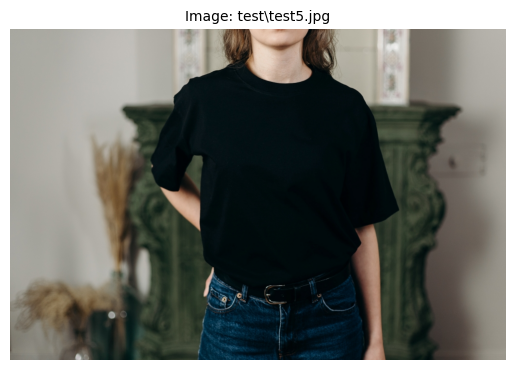

In [29]:
reference_image = test_images[4]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


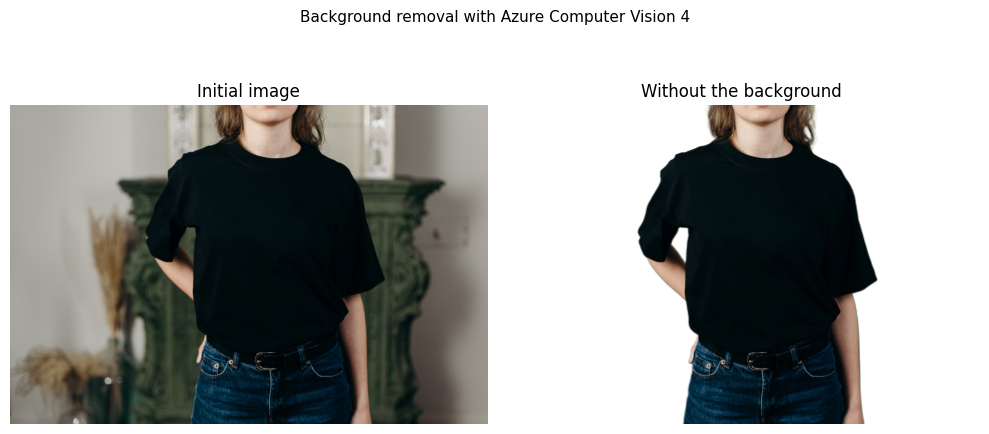

In [30]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 2 images:

001 fashion\0622444001.jpg with similarity index = 0.7072882930030973
002 fashion\0629420001.jpg with similarity index = 0.6817397925438721


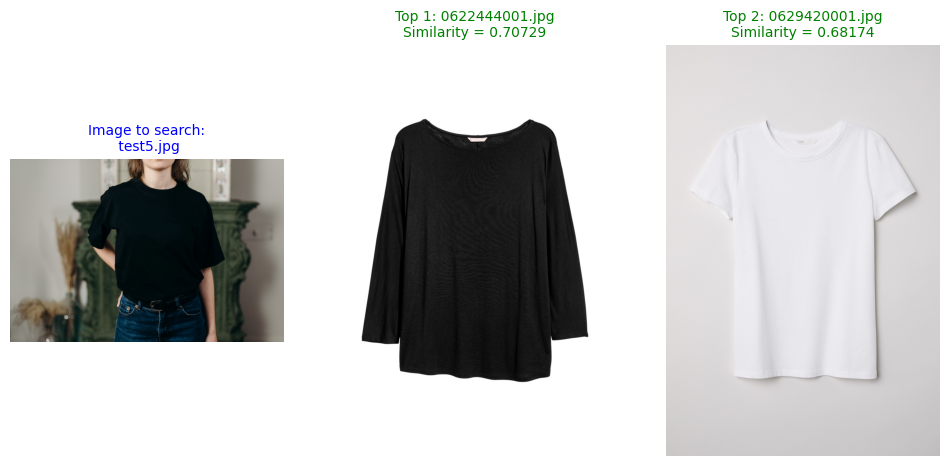

 2025-01-17 19:45:01 Powered by Azure Computer Vision Florence


,image_file,similarity
167,fashion\0622444001.jpg,0.707288
493,fashion\0629420001.jpg,0.681740
349,fashion\0625939002.jpg,0.676342
350,fashion\0625939017.jpg,0.667123
316,fashion\0625321003.jpg,0.660133
...,...,...
1199,fashion\0696148002.jpg,0.307504
206,fashion\0623374005.jpg,0.306329
707,fashion\0645920004.jpg,0.304197
1122,fashion\0695043004.jpg,0.299921


In [31]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=2, disp=True
)

### Test 6

In [32]:
# We can download an image from an url
image_URL = "https://github.com/retkowsky/images/blob/master/fashion_image.jpg?raw=true"
reference_image = "download.jpg"

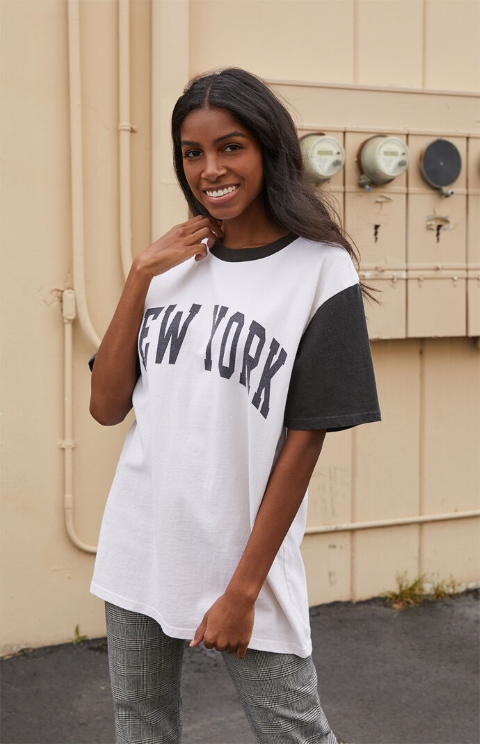

In [33]:
image = get_image_from_url(image_URL)
image

Removing background from the image using Azure Computer Vision 4.0...
Done


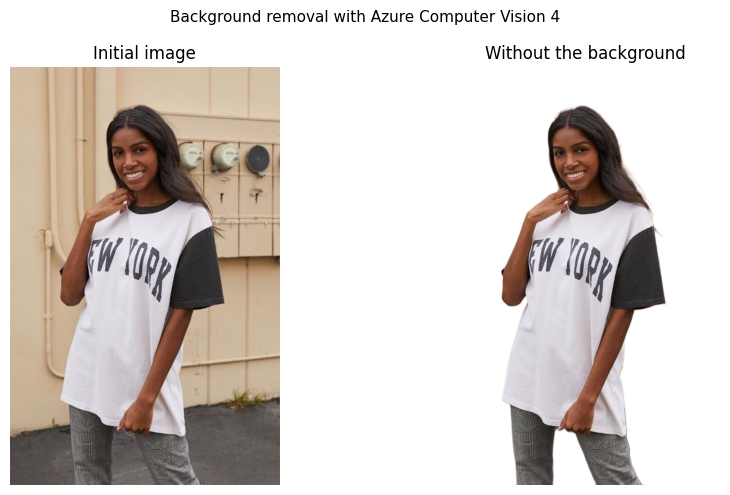

In [34]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion\0699923102.jpg with similarity index = 0.730553126345534
002 fashion\0648703010.jpg with similarity index = 0.6880728073230007
003 fashion\0642973002.jpg with similarity index = 0.6657975994506429
004 fashion\0649440014.jpg with similarity index = 0.6507248487703418
005 fashion\0641748019.jpg with similarity index = 0.6023685652896448
006 fashion\0698943005.jpg with similarity index = 0.5938865553843196


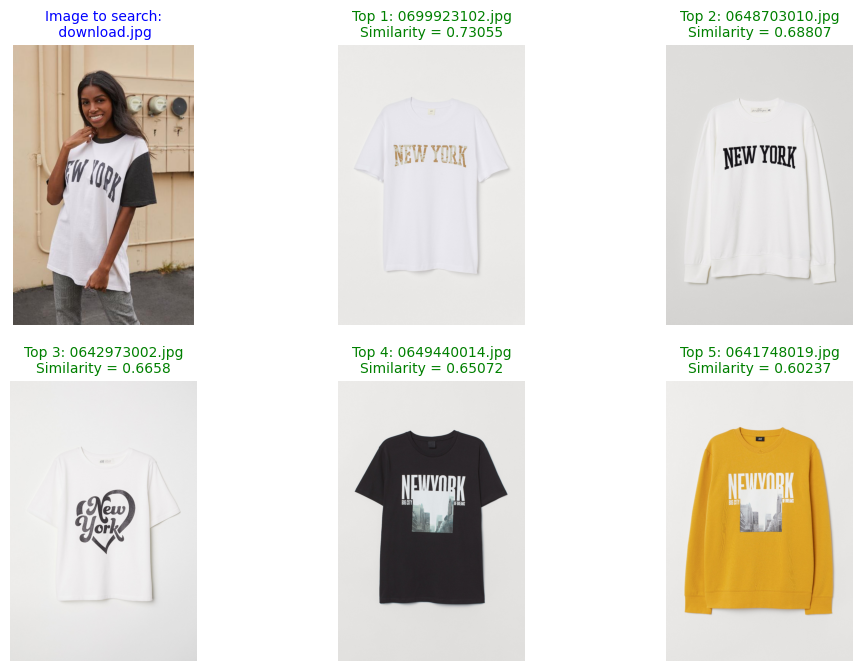

 2025-01-17 19:45:09 Powered by Azure Computer Vision Florence


,image_file,similarity
1468,fashion\0699923102.jpg,0.730553
816,fashion\0648703010.jpg,0.688073
639,fashion\0642973002.jpg,0.665798
843,fashion\0649440014.jpg,0.650725
603,fashion\0641748019.jpg,0.602369
...,...,...
421,fashion\0627092001.jpg,0.284070
1206,fashion\0696201003.jpg,0.275011
287,fashion\0625027008.jpg,0.270831
341,fashion\0625722001.jpg,0.270503


In [35]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

## 6. <a name="chapt6"></a> Visual search using some text

We can use some prompt (text) to find some articles in our catalog images.

### Test 1

In [36]:
query = "shirt with stripped lines on it"


Similar images using query = shirt with stripped lines on it


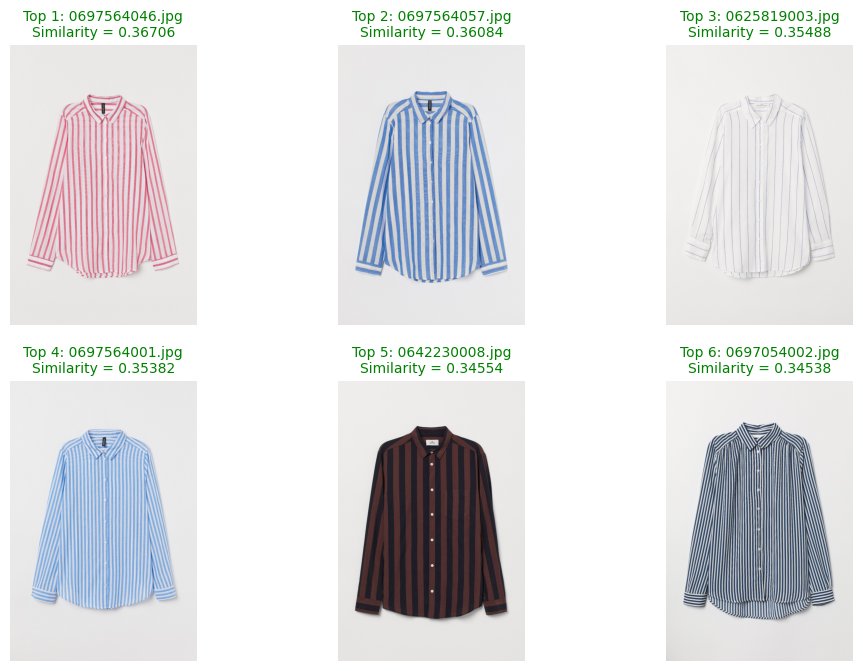

 2025-01-17 19:45:12 Powered by Azure Computer Vision Florence


,image_file,similarity
1313,fashion\0697564046.jpg,0.367058
1315,fashion\0697564057.jpg,0.360838
346,fashion\0625819003.jpg,0.354879
1309,fashion\0697564001.jpg,0.353824
617,fashion\0642230008.jpg,0.345542
...,...,...
1118,fashion\0695001001.jpg,0.103383
676,fashion\0644370001.jpg,0.100138
973,fashion\0692705001.jpg,0.095058
599,fashion\0641521002.jpg,0.092723


In [37]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 2

In [38]:
query = "torn blue jeans"


Similar images using query = torn blue jeans


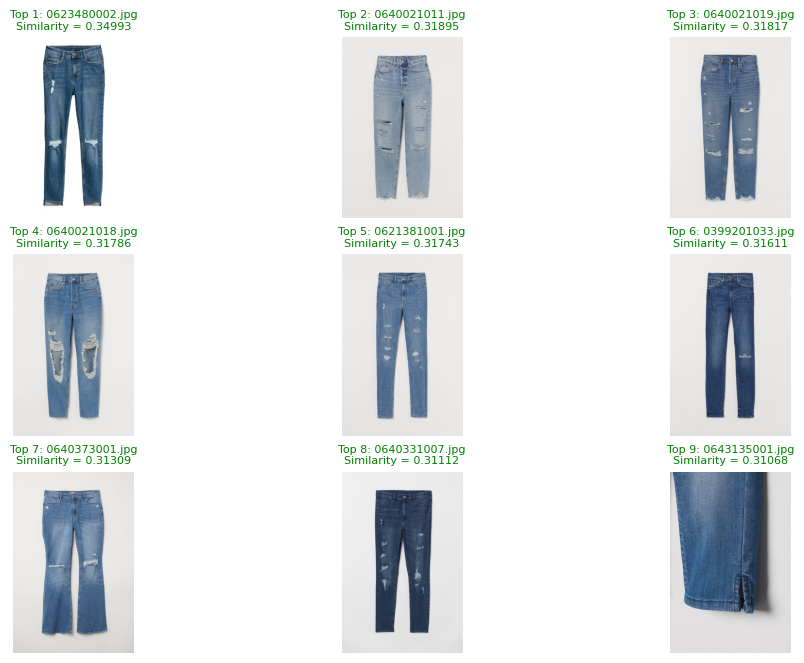

 2025-01-17 19:45:15 Powered by Azure Computer Vision Florence


,image_file,similarity
209,fashion\0623480002.jpg,0.349930
520,fashion\0640021011.jpg,0.318952
522,fashion\0640021019.jpg,0.318165
521,fashion\0640021018.jpg,0.317863
113,fashion\0621381001.jpg,0.317427
...,...,...
1228,fashion\0696628002.jpg,0.073230
1212,fashion\0696316001.jpg,0.070375
1305,fashion\0697506001.jpg,0.068017
1118,fashion\0695001001.jpg,0.067075


In [39]:
get_results_using_prompt(query, image_files, list_emb, topn=9, disp=False)

### Test 3

In [40]:
query = "red dress with long sleeves"


Similar images using query = red dress with long sleeves


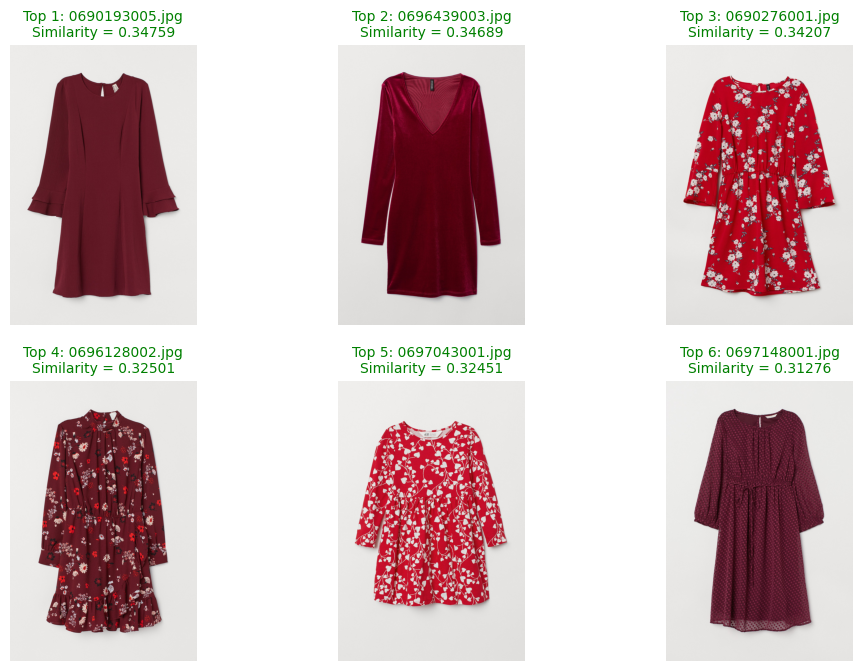

 2025-01-17 19:45:17 Powered by Azure Computer Vision Florence


,image_file,similarity
866,fashion\0690193005.jpg,0.347594
1221,fashion\0696439003.jpg,0.346889
870,fashion\0690276001.jpg,0.342066
1194,fashion\0696128002.jpg,0.325015
1263,fashion\0697043001.jpg,0.324514
...,...,...
264,fashion\0624543063.jpg,0.036877
1181,fashion\0695803006.jpg,0.035663
1100,fashion\0694739003.jpg,0.034921
141,fashion\0621768001.jpg,0.033996


In [41]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 4

In [42]:
query = "dress with flowers"


Similar images using query = dress with flowers


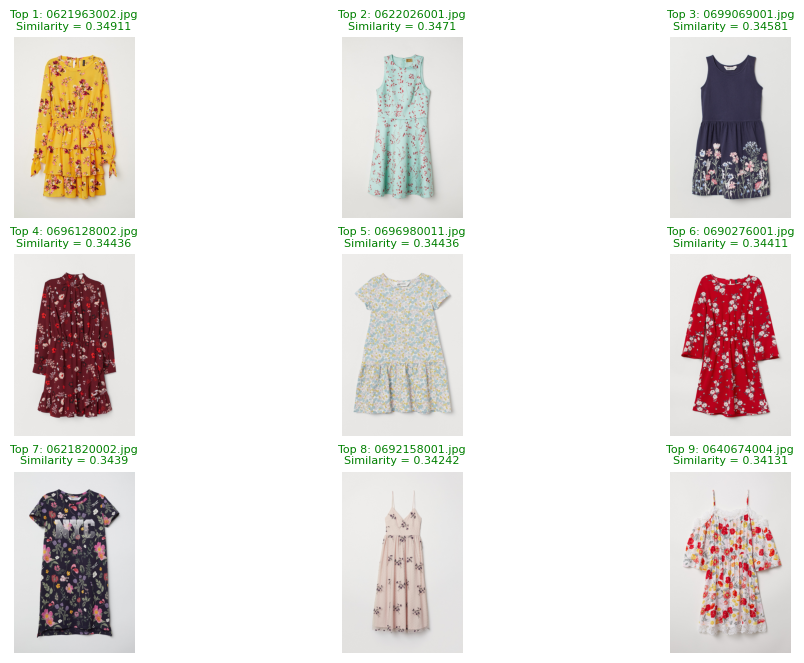

 2025-01-17 19:45:21 Powered by Azure Computer Vision Florence


,image_file,similarity
149,fashion\0621963002.jpg,0.349109
150,fashion\0622026001.jpg,0.347102
1404,fashion\0699069001.jpg,0.345807
1194,fashion\0696128002.jpg,0.344365
1255,fashion\0696980011.jpg,0.344364
...,...,...
141,fashion\0621768001.jpg,0.079236
134,fashion\0621760008.jpg,0.077810
319,fashion\0625420001.jpg,0.076986
760,fashion\0647207008.jpg,0.065966


In [43]:
get_results_using_prompt(query, image_files, list_emb, topn=9, disp=False)

### Test 5

In [44]:
query = "pink shoes"


Similar images using query = pink shoes


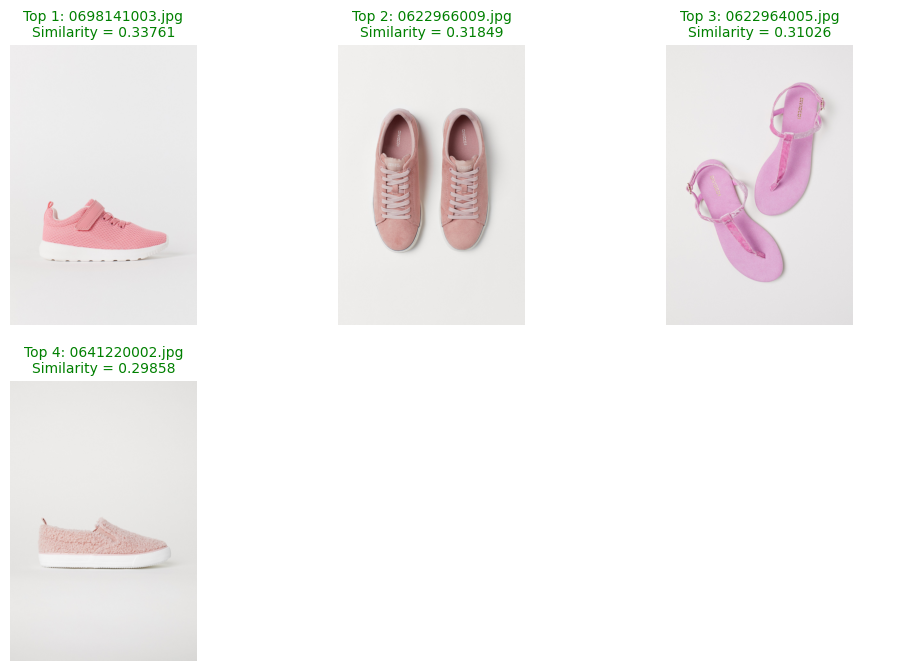

 2025-01-17 19:45:24 Powered by Azure Computer Vision Florence


,image_file,similarity
1343,fashion\0698141003.jpg,0.337611
187,fashion\0622966009.jpg,0.318486
186,fashion\0622964005.jpg,0.310257
592,fashion\0641220002.jpg,0.298577
336,fashion\0625662004.jpg,0.292184
...,...,...
1095,fashion\0694709003.jpg,0.068875
1097,fashion\0694709017.jpg,0.068193
1146,fashion\0695442001.jpg,0.064126
1143,fashion\0695411001.jpg,0.059880


In [45]:
get_results_using_prompt(query, image_files, list_emb, topn=4, disp=False)

### Test 6

In [46]:
query = "ray-ban with yellow frames"


Similar images using query = ray-ban with yellow frames


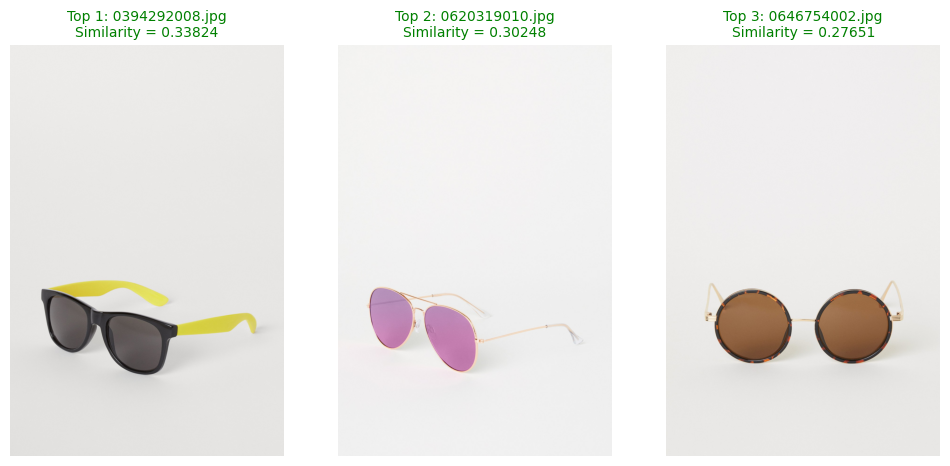

 2025-01-17 19:45:28 Powered by Azure Computer Vision Florence


,image_file,similarity
7,fashion\0394292008.jpg,0.338241
75,fashion\0620319010.jpg,0.302481
732,fashion\0646754002.jpg,0.276511
733,fashion\0646756002.jpg,0.274933
205,fashion\0623350001.jpg,0.262463
...,...,...
1427,fashion\0699349002.jpg,0.077793
181,fashion\0622955007.jpg,0.077555
348,fashion\0625930001.jpg,0.075669
571,fashion\0640735003.jpg,0.075080


In [47]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

### Test 7

In [48]:
query = "shirt with NYC written on it"


Similar images using query = shirt with NYC written on it


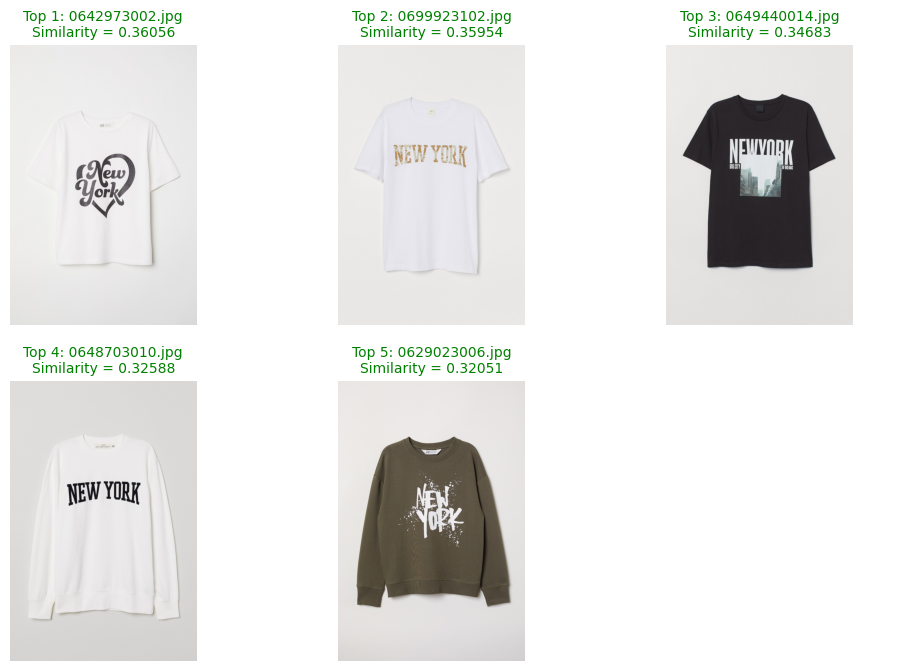

 2025-01-17 19:45:31 Powered by Azure Computer Vision Florence


,image_file,similarity
639,fashion\0642973002.jpg,0.360564
1468,fashion\0699923102.jpg,0.359537
843,fashion\0649440014.jpg,0.346830
816,fashion\0648703010.jpg,0.325885
484,fashion\0629023006.jpg,0.320508
...,...,...
92,fashion\0620608001.jpg,0.058716
246,fashion\0624216001.jpg,0.055024
580,fashion\0640989002.jpg,0.053895
1118,fashion\0695001001.jpg,0.047965


In [49]:
get_results_using_prompt(query, image_files, list_emb, topn=5, disp=False)

### Test 8

In [50]:
query = "bag with golden lace"


Similar images using query = bag with golden lace


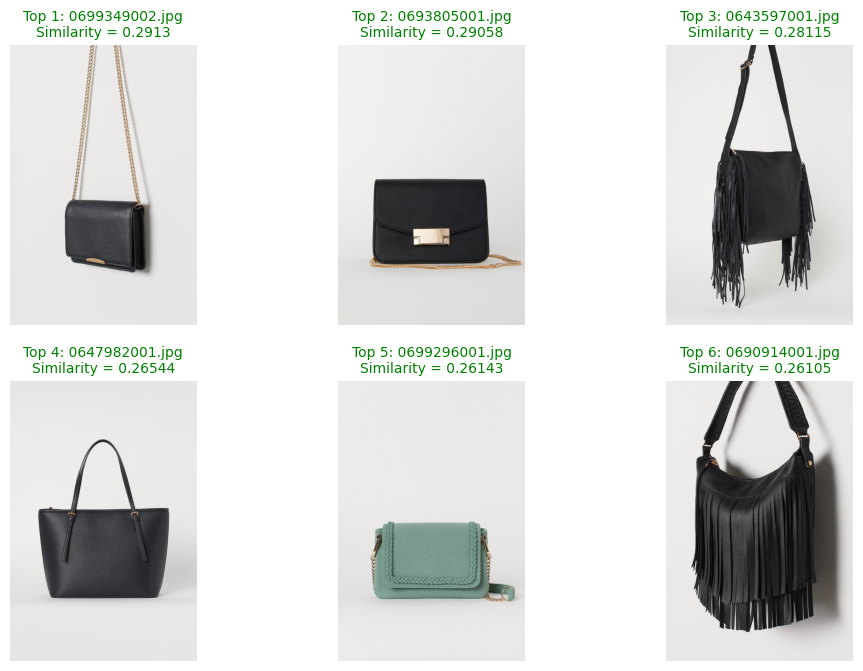

 2025-01-17 19:45:34 Powered by Azure Computer Vision Florence


,image_file,similarity
1427,fashion\0699349002.jpg,0.291301
1046,fashion\0693805001.jpg,0.290578
658,fashion\0643597001.jpg,0.281152
786,fashion\0647982001.jpg,0.265438
1423,fashion\0699296001.jpg,0.261433
...,...,...
722,fashion\0646195001.jpg,0.058596
258,fashion\0624486091.jpg,0.058363
1146,fashion\0695442001.jpg,0.050719
141,fashion\0621768001.jpg,0.048941


In [51]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 9

In [52]:
query = "dreams"

Top 3 images:

001 fashion\0620008004.jpg with similarity index = 0.2852919408145052
002 fashion\0625648002.jpg with similarity index = 0.25680809716719155
003 fashion\0640536001.jpg with similarity index = 0.23735166693700985

Similar images using query = dreams


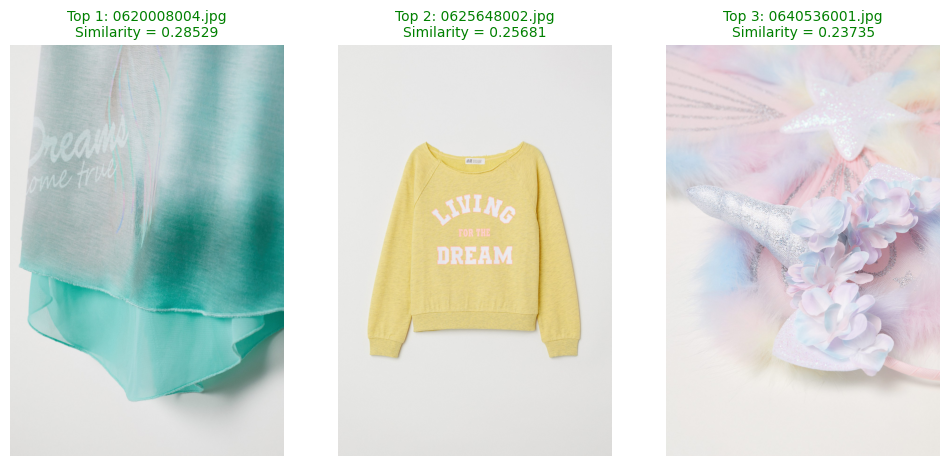

 2025-01-17 19:45:36 Powered by Azure Computer Vision Florence


,image_file,similarity
43,fashion\0620008004.jpg,0.285292
332,fashion\0625648002.jpg,0.256808
557,fashion\0640536001.jpg,0.237352
468,fashion\0628755002.jpg,0.229576
303,fashion\0625179002.jpg,0.226221
...,...,...
411,fashion\0626705004.jpg,0.115119
705,fashion\0645891001.jpg,0.114468
926,fashion\0691527002.jpg,0.113996
452,fashion\0628499008.jpg,0.112950


In [53]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=True)

### Test 10

In [54]:
query = "article with a bird"


Similar images using query = article with a bird


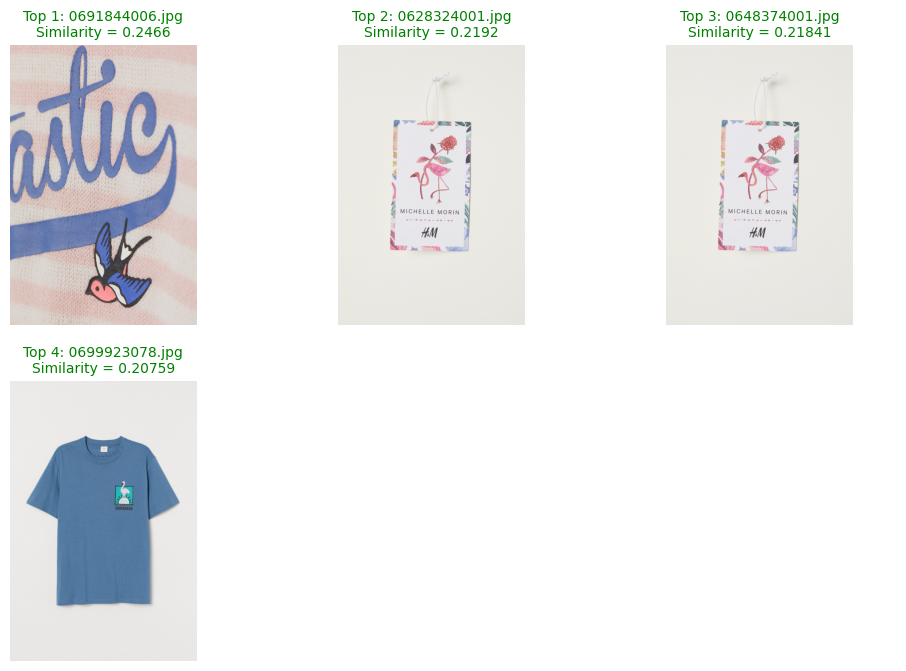

 2025-01-17 19:45:39 Powered by Azure Computer Vision Florence


,image_file,similarity
946,fashion\0691844006.jpg,0.246603
441,fashion\0628324001.jpg,0.219202
803,fashion\0648374001.jpg,0.218407
1465,fashion\0699923078.jpg,0.207593
468,fashion\0628755002.jpg,0.199328
...,...,...
571,fashion\0640735003.jpg,0.060212
135,fashion\0621760009.jpg,0.059840
26,fashion\0398959003.jpg,0.058330
1377,fashion\0698647010.jpg,0.045818


In [55]:
get_results_using_prompt(query, image_files, list_emb, topn=4, disp=False)

### Test 11

In [56]:
query = "Italian or Japanese cities"


Similar images using query = Italian or Japanese cities


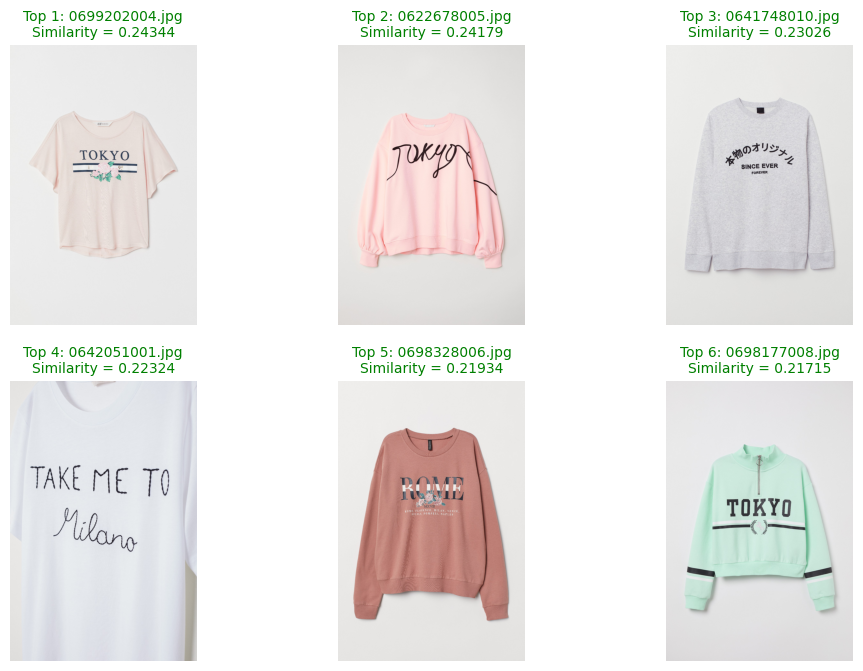

 2025-01-17 19:45:42 Powered by Azure Computer Vision Florence


,image_file,similarity
1417,fashion\0699202004.jpg,0.243441
169,fashion\0622678005.jpg,0.241790
602,fashion\0641748010.jpg,0.230262
611,fashion\0642051001.jpg,0.223237
1356,fashion\0698328006.jpg,0.219338
...,...,...
659,fashion\0643628003.jpg,0.091015
652,fashion\0643350001.jpg,0.090577
1199,fashion\0696148002.jpg,0.090252
172,fashion\0622845004.jpg,0.088374


In [57]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 12

In [58]:
query = "leather belt"


Similar images using query = leather belt


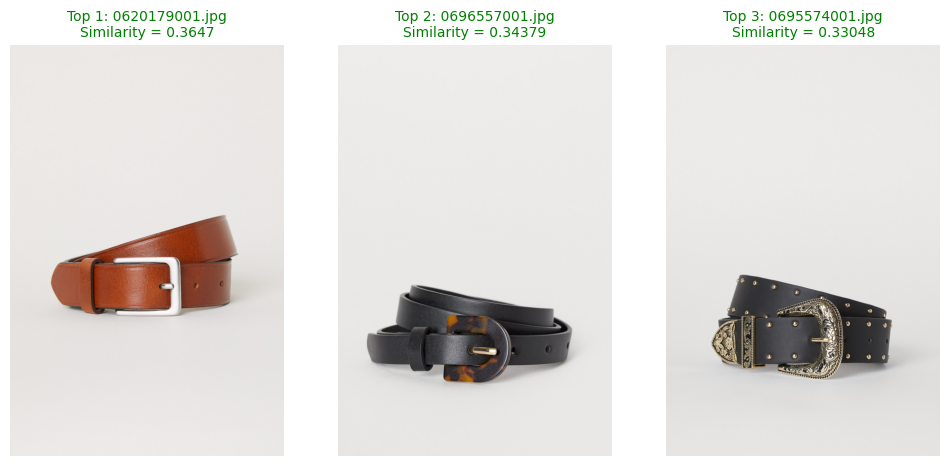

 2025-01-17 19:45:44 Powered by Azure Computer Vision Florence


,image_file,similarity
51,fashion\0620179001.jpg,0.364698
1227,fashion\0696557001.jpg,0.343789
1153,fashion\0695574001.jpg,0.330484
618,fashion\0642268001.jpg,0.308917
591,fashion\0641204001.jpg,0.297205
...,...,...
233,fashion\0623997001.jpg,0.127923
506,fashion\0629656005.jpg,0.126908
1308,fashion\0697532004.jpg,0.126319
1199,fashion\0696148002.jpg,0.123960


In [59]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

### Test 13

In [60]:
query = "butterfly hair pin"


Similar images using query = butterfly hair pin


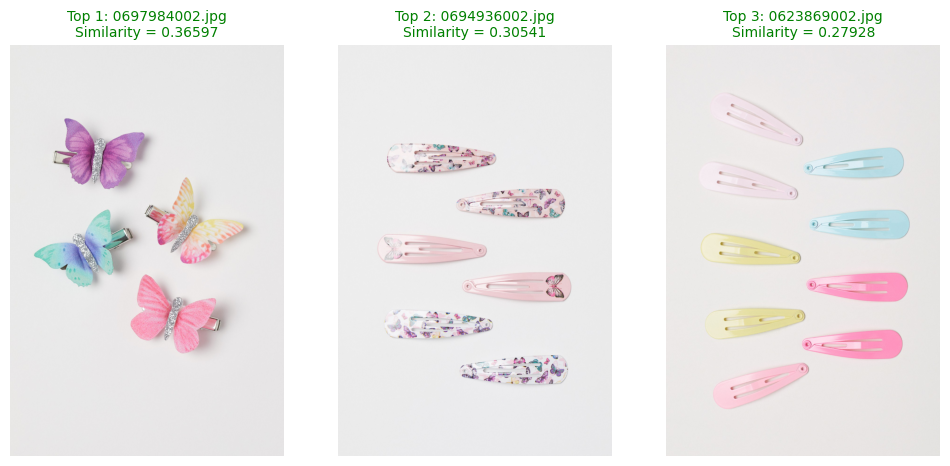

 2025-01-17 19:45:46 Powered by Azure Computer Vision Florence


,image_file,similarity
1338,fashion\0697984002.jpg,0.365969
1113,fashion\0694936002.jpg,0.305414
224,fashion\0623869002.jpg,0.279282
1288,fashion\0697112001.jpg,0.253911
500,fashion\0629485001.jpg,0.253129
...,...,...
1329,fashion\0697920007.jpg,0.062289
1330,fashion\0697920035.jpg,0.056429
760,fashion\0647207008.jpg,0.053614
1332,fashion\0697920055.jpg,0.053100


In [61]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

### Test 14

In [62]:
query = "shirt with shark, dolphin, fish or whale"


Similar images using query = shirt with shark, dolphin, fish or whale


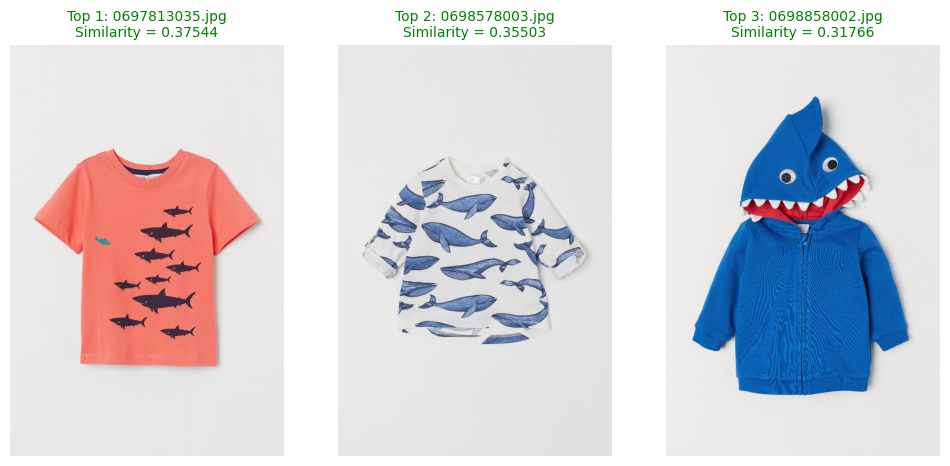

 2025-01-17 19:45:48 Powered by Azure Computer Vision Florence


,image_file,similarity
1323,fashion\0697813035.jpg,0.375443
1373,fashion\0698578003.jpg,0.355028
1388,fashion\0698858002.jpg,0.317664
1411,fashion\0699145001.jpg,0.307756
1464,fashion\0699923066.jpg,0.298537
...,...,...
850,fashion\0649555002.jpg,0.043099
581,fashion\0640990001.jpg,0.042377
580,fashion\0640989002.jpg,0.038590
785,fashion\0647946004.jpg,0.037169


In [63]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

> In the next notebook we will do some image clustering using vector embeddings